In [16]:
import pandas as pd
import cbsodata

data = pd.DataFrame(cbsodata.get_data('83162ENG'))
print(data.head())

data.to_excel("hollandhouserent.xlsx")

   ID          Regions Periods  RentIncreaseIncludingHarmonisation_1  \
0   0  The Netherlands    2015                                   2.4   
1   1  The Netherlands    2016                                   1.9   
2   2  The Netherlands    2017                                   1.6   
3   3  The Netherlands    2018                                   2.3   
4   4  The Netherlands    2019                                   2.5   

   RentIncreaseExcludingHarmonisation_2  
0                                   1.9  
1                                   1.4  
2                                   1.2  
3                                   1.8  
4                                   2.1  


In [26]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

#This code is for graph looks better.
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use('seaborn-ticks')
plt.rcParams['figure.figsize'] = [20, 10] 
plt.rcParams['figure.dpi'] = 500 

#83162ENG Rent increase dwellings; region on CBS.https://www.cbs.nl/en-gb/figures/detail/83162ENG?q=83162eng
rent = '83162ENG' 

data = pd.DataFrame(cbsodata.get_data(rent))
data["RentIncreaseIncludingHarmonisation_1"] = data["RentIncreaseIncludingHarmonisation_1"] / 100

# Create a pivot table with Regions as the index and Periods as the columns
pivot_table = data.pivot_table(index='Regions', columns='Periods', values='RentIncreaseIncludingHarmonisation_1')


# Plot the pivot table as a heatmap
ax = sns.heatmap(pivot_table, cmap='RdYlGn', annot=True, fmt='.2%', cbar=False)

# Set x-axis label
plt.xlabel('Year')

# Set y-axis label
plt.ylabel('Regions')

# Set plot title
plt.title('Rent Increase Rates by Region (YoY %)')

# Get the current axis
ax = plt.gca()

# Align the y-axis tick labels to the right
ax.yaxis.set_ticklabels(ax.yaxis.get_ticklabels(), ha='left')

#Show graph
plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_10196\2619360224.py:8: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-ticks')


C:\Users\user\AppData\Local\Temp\ipykernel_10196\2101290384.py:9: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-ticks')
C:\Users\user\AppData\Local\Temp\ipykernel_10196\2101290384.py:31: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


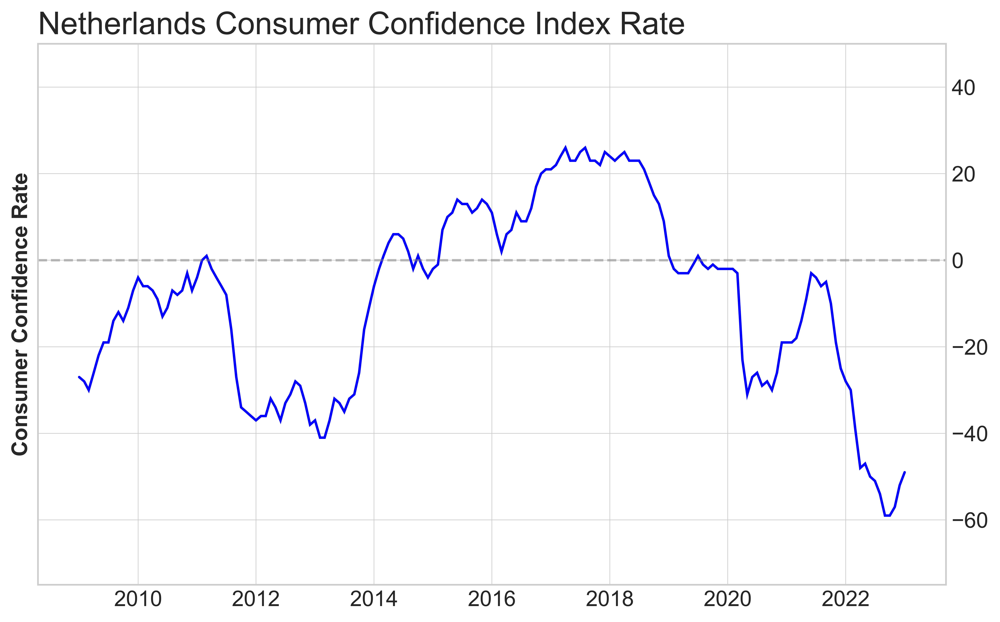

In [46]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

#This code is for graph looks better.
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use('seaborn-ticks')
plt.rcParams['figure.figsize'] = [10, 5] 
plt.rcParams['figure.dpi'] = 500 


conf = '83693ENG'

#'83693ENG' Netherlands Consumer Confidence Index on CBS https://opendata.cbs.nl/statline/portal.html?_la=en&_catalog=CBS&tableId=83693ENG&_theme=1091

data = pd.DataFrame(cbsodata.get_data(conf))

data['Periods'] = data['Periods'].str.strip()
data['Periods'] = pd.to_datetime(data['Periods'], format='%Y %B')

start_date = '2009-01-01'
end_date = '2023-01-01'

mask = (data['Periods'] >= start_date) & (data['Periods'] <= end_date)

selected_data = data.loc[mask]

# Set the style to 'seaborn-whitegrid' for a white background with gridlines
plt.style.use('seaborn-whitegrid')

# Create the plot
fig, ax = plt.subplots(figsize=(10,6))
ax.plot(selected_data['Periods'], selected_data['ConsumerConfidence_1'], color='blue')

# Interrupt the line at zero
ax.axhline(y=0, color='gray', linestyle='--', alpha=0.5)

# Set the min max value of y axis.
ax.set_ylim(bottom=-75, top=50)

# Set the title of the graph.
ax.set_title('Netherlands Consumer Confidence Index Rate')

# Set the y-axis label
ax.set_ylabel('Consumer Confidence Rate')

# Show the plot
plt.show()



In [48]:
import re
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

#This code is for graph looks better.
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use('seaborn-ticks')
plt.rcParams['figure.figsize'] = [10, 5] 
plt.rcParams['figure.dpi'] = 500 


house = '82608ENG' 

#'82608ENG' This code provides figures on the expenditures of households in values and volume.https://www.cbs.nl/en-gb/figures/detail/82608eng#ValueChanges_5

data = pd.DataFrame(cbsodata.get_data(house))

df = data[data["ConsumptionByHouseholds"] == "Domestic consumption by households"]

# Drop the periods which is different then "YYYY MM" format.
def extract_second_type_datetime(period):
    # Extract the second type of datetime using regular expression
    match = re.match(r'(\d{4})\s([A-Za-z]+$)', period)
    if match:
        year = match.group(1)
        month = match.group(2)
        return f"{year} {month}"
    return None

# Extract the second type of datetime in a new column
df["second_type_datetime"] = df["Periods"].apply(extract_second_type_datetime)

# Remove the rows that have None in the "second_type_datetime" column
df = df[df["second_type_datetime"].notna()]

# Drop the "Periods" column
df.drop("Periods", axis=1, inplace=True)

# Set the start date and end date
start_date = "2019-01"
end_date = "2022-12"

# Filter the dataframe based on the start date and end date
df = df[(df["second_type_datetime"] >= start_date) & (df["second_type_datetime"] <= end_date)]

# Set the style to 'seaborn-whitegrid' for a white background with gridlines
plt.style.use('seaborn-whitegrid')

# Plot a bar graph with blue color
ax = sns.barplot(x='second_type_datetime', y='VolumeChangesShoppingdayAdjusted_3', data=df, color='blue' )
ax.set_title('Netherlands Consumption By Households Volume Changes YoY%')

# Rotate x-axis labels for readability
plt.xticks(rotation=45, ha='right')

# Show the plot
plt.show()


C:\Users\user\AppData\Local\Temp\ipykernel_10196\3551557480.py:10: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-ticks')
C:\Users\user\AppData\Local\Temp\ipykernel_10196\3551557480.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["second_type_datetime"] = df["Periods"].apply(extract_second_type_datetime)
C:\Users\user\AppData\Local\Temp\ipykernel_10196\3551557480.py:50: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer corres

C:\Users\user\AppData\Local\Temp\ipykernel_10196\357786132.py:9: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-ticks')
C:\Users\user\AppData\Local\Temp\ipykernel_10196\357786132.py:51: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


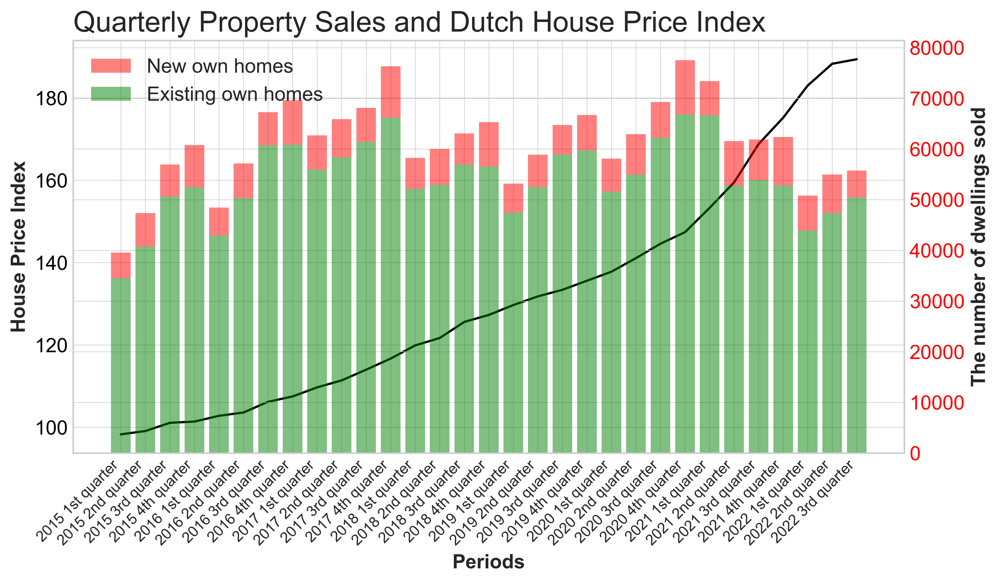

In [52]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

#This code is for graph looks better.
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use('seaborn-ticks')
plt.rcParams['figure.figsize'] = [10, 5] 
plt.rcParams['figure.dpi'] = 300 


hprice = '84064ENG' 

#'84064ENG' The House Price Index (HPI) measures the price development of dwellings purchased by households and quarterly property sales. https://www.cbs.nl/en-gb/figures/detail/84064ENG?q=84064eng

data = pd.DataFrame(cbsodata.get_data(hprice))

data.to_excel("housened.xlsx")


# Create a new dataframe with the specified columns
new_data = data[["TypeOfDwelling", "Periods", "Number_4", "PriceIndex_1"]]

# Remove "Total of own houses" from "TypeOfDwellings"

periods = ["2015 1st quarter", "2015 2nd quarter", "2015 3rd quarter", "2015 4th quarter",
           "2016 1st quarter", "2016 2nd quarter", "2016 3rd quarter", "2016 4th quarter",
           "2017 1st quarter", "2017 2nd quarter", "2017 3rd quarter", "2017 4th quarter",
           "2018 1st quarter", "2018 2nd quarter", "2018 3rd quarter", "2018 4th quarter",
           "2019 1st quarter", "2019 2nd quarter", "2019 3rd quarter", "2019 4th quarter",
           "2020 1st quarter", "2020 2nd quarter", "2020 3rd quarter", "2020 4th quarter",
           "2021 1st quarter", "2021 2nd quarter", "2021 3rd quarter", "2021 4th quarter",
           "2022 1st quarter", "2022 2nd quarter", "2022 3rd quarter"]

# Filter the dataframe to get the periods in the "periods" list
new_data = new_data[new_data['Periods'].isin(periods)]

new_data.to_excel("housened.xlsx")

# Group the data by 'Periods' and 'TypeOfDwelling'
grouped_data = new_data.groupby(["Periods", "TypeOfDwelling"]).sum()

# Unstack the data to create two separate dataframes for 'New own homes' and 'Existing own homes'
new_own_homes = grouped_data.xs("New own homes", level="TypeOfDwelling")
existing_own_homes = grouped_data.xs("Existing own homes", level="TypeOfDwelling")
own_houses_data = new_data[new_data['TypeOfDwelling'] == 'Total of own houses']

# Set the style to 'seaborn-whitegrid' for a white background with gridlines
plt.style.use('seaborn-whitegrid')

# Plot the 'PriceIndex_1' on a line graph
fig, ax1 = plt.subplots()
ax1.plot(own_houses_data["Periods"], own_houses_data["PriceIndex_1"], color="black", label="HPI")
ax1.set_xlabel("Periods")
ax1.set_ylabel("House Price Index")
ax1.tick_params(axis='y', labelcolor="black")
plt.xticks(rotation=45, ha='right', fontsize=10)

# Plot the 'Number_4' for 'New own homes' and 'Existing own homes' on a stacked column chart
ax2 = ax1.twinx()
ax2.bar(new_own_homes.index.get_level_values(0), new_own_homes["Number_4"], color="red", label="New own homes", alpha=0.5, bottom=existing_own_homes["Number_4"])
ax2.bar(existing_own_homes.index.get_level_values(0), existing_own_homes["Number_4"], color="green", label="Existing own homes", alpha=0.5)
ax2.set_ylabel("The number of dwellings sold")
ax2.tick_params(axis='y', labelcolor="red")


# Add a legend to the plot
plt.legend()

plt.title("Quarterly Property Sales and Dutch House Price Index")

# Show the plot
plt.show()



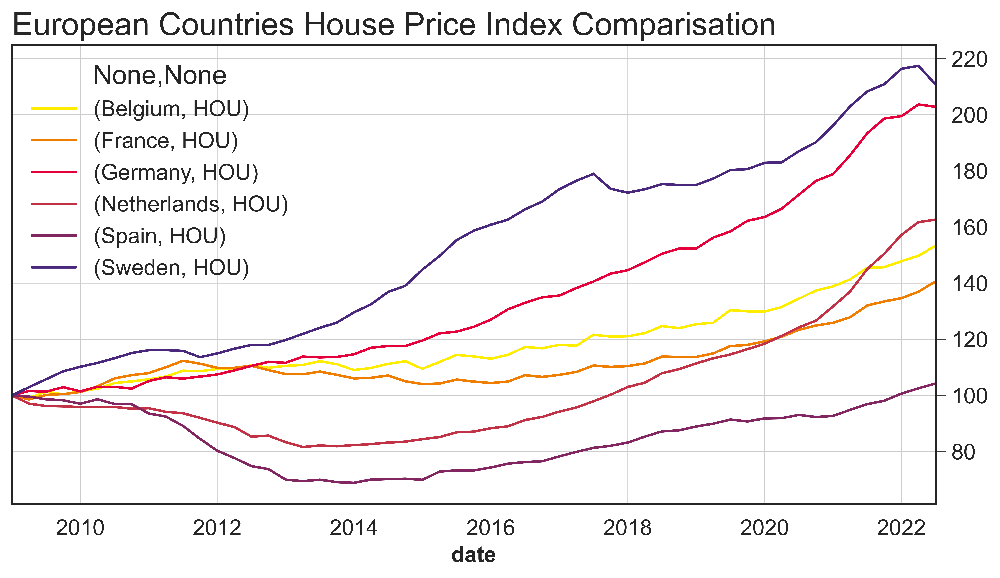

In [44]:
from openbb_terminal.sdk import openbb
import matplotlib.pyplot as plt

# See more about macro from openbb https://docs.openbb.co/sdk/reference/economy/macro 
macro_df, units, denomination = openbb.economy.macro(parameters=['HOU'], countries=['Netherlands',  "Germany", "France", "Belgium", "Sweden", "Spain"], start_date= "2009-01-01", end_date="2022-07-01")

rate =  100 / macro_df.iloc[0, :]
macro_df = macro_df.mul(rate, axis=1)

rate.head(5)

macro_df.plot(kind='line', grid=True)

plt.title("European Countries House Price Index Comparisation")

plt.show()

macro_df.to_excel("nethouse.xlsx")

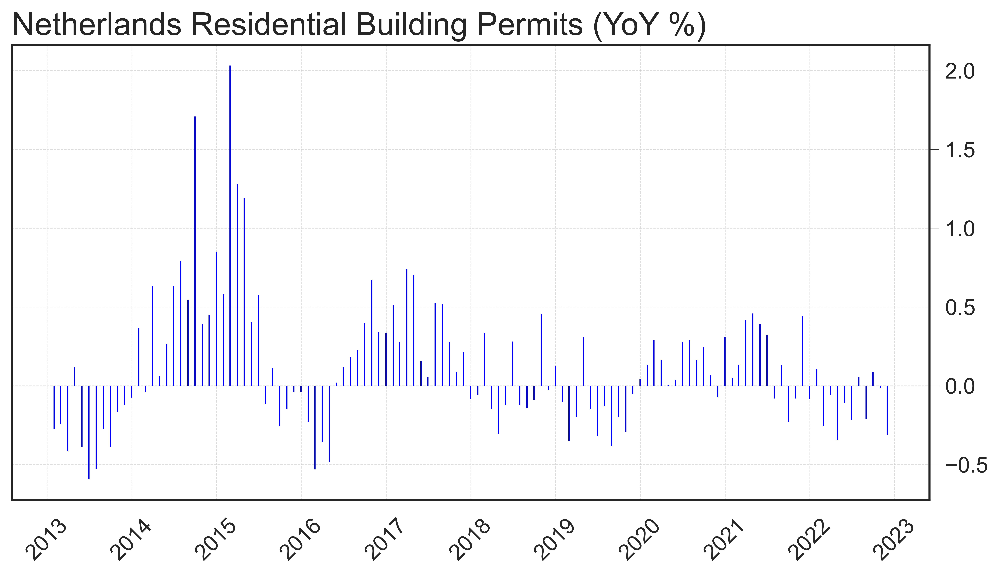

In [43]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

#This code is for graph looks better.
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use('seaborn-ticks')
plt.rcParams['figure.figsize'] = [10, 5] 
plt.rcParams['figure.dpi'] = 500 


conf = '83668NED'

#'83668NED' Netherlands Residential Buildiing Permits on CBS https://opendata.cbs.nl/#/CBS/nl/dataset/83668NED/table?ts=1675861287835

data = pd.DataFrame(cbsodata.get_data(conf))

# Create the desired date range
start_date = "2012-01-30"
end_date = "2022-11-30"
dates = pd.date_range(start_date, end_date, freq='M')

# Add the dates to the data frame as a new column
data['Dates'] = dates

# Drop the "Perioden" column
data = data.drop(columns=['Perioden'])

# Calculate the YoY rate
data['YoY Rate'] = data['Woningen_1'].pct_change(periods=12)

# Remove the first 12 rows of the data frame, since there is no YoY rate for the first 12 months
data = data.iloc[12:]

data.to_excel("residencepermit2.xlsx")

# Create a bar chart with the Dates and value columns
plt.bar(data['Dates'], data['YoY Rate'], color='blue', width=5)

# Set the x-axis labels to be the dates, rotated by 45 degrees for readability
plt.xticks(rotation=45)

# Add a grid background to the plot
plt.grid(linestyle='--', alpha=0.7)

# Add a title to the plot
plt.title("Netherlands Residential Building Permits (YoY %)")

# Show the plot
plt.show()
